In [1]:
import os
import json
import random
import pickle
import datetime

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

from tensorflow.keras import layers
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint


2026-05-12 01:53:11.479707: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1778550791.672023      22 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1778550791.725337      22 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1778550792.136183      22 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778550792.136228      22 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778550792.136231      22 computation_placer.cc:177] computation placer alr

In [2]:
SEEDS = [42, 123, 2024, 3407, 777]

BATCH_SIZE = 32
EPOCHS = 50
PATIENCE = 5
IMAGE_SIZE = (224, 224)
LEARNING_RATE = 1e-5
FINE_TUNE_LAYERS = 20
AUTOTUNE = tf.data.AUTOTUNE

EXPERIMENT_NAME = "EfficientNetB0_7class"
EXPECTED_NUM_CLASSES = 7


In [3]:
DATASET_DIR = "/kaggle/input/datasets/shahadhossin567r7455/potato-leaf-disease-dataset/Potato Leaf DIsease"

print("Dataset directory:", DATASET_DIR)


Dataset directory: /kaggle/input/datasets/shahadhossin567r7455/potato-leaf-disease-dataset/Potato Leaf DIsease


In [4]:
class_names = sorted([
    folder for folder in os.listdir(DATASET_DIR)
    if os.path.isdir(os.path.join(DATASET_DIR, folder))
])

NUM_CLASSES = len(class_names)

print("Detected classes:")
for i, class_name in enumerate(class_names):
    print(f"{i}: {class_name}")

print("Number of classes:", NUM_CLASSES)

assert NUM_CLASSES == EXPECTED_NUM_CLASSES, f"Expected {EXPECTED_NUM_CLASSES}, found {NUM_CLASSES}"


Detected classes:
0: Early Blight
1: Fungal Diseases
2: Healthy
3: Late Blight
4: Plant Pests
5: Potato Cyst Nematode
6: Potato Virus
Number of classes: 7


In [5]:
valid_extensions = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

file_paths = []
labels = []

for label_index, class_name in enumerate(class_names):
    class_dir = os.path.join(DATASET_DIR, class_name)

    for fname in os.listdir(class_dir):
        if fname.lower().endswith(valid_extensions):
            file_paths.append(os.path.join(class_dir, fname))
            labels.append(label_index)

file_paths = np.array(file_paths)
labels = np.array(labels)

print("Total images:", len(labels))

unique, counts = np.unique(labels, return_counts=True)
print("\nClass distribution:")
for idx, count in zip(unique, counts):
    print(f"{class_names[idx]}: {count}")


Total images: 3500

Class distribution:
Early Blight: 500
Fungal Diseases: 500
Healthy: 500
Late Blight: 500
Plant Pests: 500
Potato Cyst Nematode: 500
Potato Virus: 500


In [6]:
def load_dataset_effnet(file_paths, labels, augment=False, shuffle=True, seed=None):
    ds = tf.data.Dataset.from_tensor_slices((file_paths, labels))

    def process(path, label):
        image = tf.io.read_file(path)
        image = tf.image.decode_image(image, channels=3, expand_animations=False)
        image.set_shape([None, None, 3])

        image = tf.image.resize(image, IMAGE_SIZE)
        image = tf.cast(image, tf.float32)

        if augment:
            image = tf.image.random_flip_left_right(image)
            image = tf.image.random_brightness(image, max_delta=25.5)
            image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
            image = tf.clip_by_value(image, 0.0, 255.0)

        image = preprocess_input(image)
        label = tf.one_hot(label, depth=NUM_CLASSES)

        return image, label

    ds = ds.map(process, num_parallel_calls=AUTOTUNE)

    if shuffle:
        ds = ds.shuffle(
            buffer_size=len(file_paths),
            seed=seed,
            reshuffle_each_iteration=True
        )

    ds = ds.batch(BATCH_SIZE).prefetch(AUTOTUNE)

    return ds


In [7]:
def build_efficientnet_b0(num_classes, input_shape=(224, 224, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    backbone = EfficientNetB0(
        include_top=False,
        weights="imagenet",
        input_tensor=inputs
    )

    backbone.trainable = True

    for layer in backbone.layers[:-FINE_TUNE_LAYERS]:
        layer.trainable = False

    x = backbone.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = tf.keras.Model(
        inputs=inputs,
        outputs=outputs,
        name="EfficientNetB0_7class_finetuned"
    )

    return model


In [8]:
def count_model_parameters(model):
    total_params = model.count_params()

    trainable_params = np.sum([
        np.prod(v.shape) for v in model.trainable_weights
    ])

    non_trainable_params = np.sum([
        np.prod(v.shape) for v in model.non_trainable_weights
    ])

    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")
    print(f"Non-trainable parameters: {non_trainable_params:,}")

    return total_params, trainable_params, non_trainable_params


In [9]:
def run_single_seed(seed):
    print("\n" + "=" * 70)
    print(f"Running seed: {seed}")
    print("=" * 70)

    tf.keras.backend.clear_session()
    tf.keras.utils.set_random_seed(seed)

    X_train, X_temp, y_train, y_temp = train_test_split(
        file_paths,
        labels,
        test_size=0.20,
        stratify=labels,
        random_state=seed
    )

    X_val, X_test, y_val, y_test = train_test_split(
        X_temp,
        y_temp,
        test_size=0.50,
        stratify=y_temp,
        random_state=seed
    )

    print(f"Train: {len(X_train)}")
    print(f"Validation: {len(X_val)}")
    print(f"Test: {len(X_test)}")

    class_weight_vals = compute_class_weight(
        class_weight="balanced",
        classes=np.arange(NUM_CLASSES),
        y=y_train
    )
    class_weight = dict(enumerate(class_weight_vals))

    print("Class weights:", class_weight)

    train_ds = load_dataset_effnet(X_train, y_train, augment=True, shuffle=True, seed=seed)
    val_ds = load_dataset_effnet(X_val, y_val, augment=False, shuffle=False, seed=seed)
    test_ds = load_dataset_effnet(X_test, y_test, augment=False, shuffle=False, seed=seed)

    model = build_efficientnet_b0(num_classes=NUM_CLASSES)

    total_params, trainable_params, non_trainable_params = count_model_parameters(model)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )

    os.makedirs("models", exist_ok=True)
    os.makedirs("history", exist_ok=True)
    os.makedirs("reports", exist_ok=True)

    run_name = f"{EXPERIMENT_NAME}_seed_{seed}"

    model_path = f"models/{run_name}.keras"
    history_path = f"history/{run_name}_history.pkl"
    plot_path = f"history/{run_name}_accuracy_loss.png"
    cm_path = f"history/{run_name}_confusion_matrix.png"
    report_path = f"reports/{run_name}_classification_report.json"

    early_stop = EarlyStopping(
        monitor="val_loss",
        patience=PATIENCE,
        restore_best_weights=True
    )

    checkpoint = ModelCheckpoint(
        model_path,
        monitor="val_loss",
        save_best_only=True
    )

    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS,
        callbacks=[early_stop, checkpoint],
        class_weight=class_weight
    )

    stopped_epoch = len(history.history["loss"])
    best_epoch = int(np.argmin(history.history["val_loss"]) + 1)

    with open(history_path, "wb") as f:
        pickle.dump(history.history, f)

    test_loss, test_acc = model.evaluate(test_ds, verbose=0)

    y_true = []
    y_pred = []

    for images, batch_labels in test_ds:
        probs = model.predict(images, verbose=0)
        y_true.extend(np.argmax(batch_labels.numpy(), axis=1))
        y_pred.extend(np.argmax(probs, axis=1))

    report_dict = classification_report(
        y_true,
        y_pred,
        target_names=class_names,
        digits=4,
        output_dict=True
    )

    with open(report_path, "w") as f:
        json.dump(report_dict, f, indent=4)

    print(f"\nSeed {seed} Test Accuracy: {test_acc:.4f}")
    print(f"Seed {seed} Test Loss: {test_loss:.4f}")
    print(f"Seed {seed} Stopped Epoch: {stopped_epoch}")
    print(f"Seed {seed} Best Epoch: {best_epoch}")

    print("\nClassification Report:")
    print(classification_report(
        y_true,
        y_pred,
        target_names=class_names,
        digits=4
    ))

    cm = confusion_matrix(y_true, y_pred)

    fig, ax = plt.subplots(figsize=(10, 10))
    disp = ConfusionMatrixDisplay(
        confusion_matrix=cm,
        display_labels=class_names
    )
    disp.plot(
        ax=ax,
        cmap="Blues",
        colorbar=False,
        xticks_rotation=45
    )
    plt.title(f"Confusion Matrix - Seed {seed}")
    plt.tight_layout()
    plt.savefig(cm_path, dpi=300)
    plt.show()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Accuracy")
    plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
    plt.title(f"Accuracy - Seed {seed}")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Validation Loss")
    plt.title(f"Loss - Seed {seed}")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    plt.tight_layout()
    plt.savefig(plot_path, dpi=300)
    plt.show()

    return {
        "seed": seed,
        "num_classes": NUM_CLASSES,
        "test_accuracy": test_acc,
        "test_loss": test_loss,
        "stopped_epoch": stopped_epoch,
        "best_epoch": best_epoch,
        "macro_precision": report_dict["macro avg"]["precision"],
        "macro_recall": report_dict["macro avg"]["recall"],
        "macro_f1": report_dict["macro avg"]["f1-score"],
        "weighted_precision": report_dict["weighted avg"]["precision"],
        "weighted_recall": report_dict["weighted avg"]["recall"],
        "weighted_f1": report_dict["weighted avg"]["f1-score"],
        "total_params": total_params,
        "trainable_params": trainable_params,
        "non_trainable_params": non_trainable_params,
        "model_path": model_path,
        "history_path": history_path,
        "plot_path": plot_path,
        "confusion_matrix_path": cm_path,
        "classification_report_path": report_path
    }



Running seed: 42
Train: 2800
Validation: 350
Test: 350
Class weights: {0: np.float64(1.0), 1: np.float64(1.0), 2: np.float64(1.0), 3: np.float64(1.0), 4: np.float64(1.0), 5: np.float64(1.0), 6: np.float64(1.0)}


I0000 00:00:1778550817.020614      22 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Total parameters: 4,058,538
Trainable parameters: 1,359,927
Non-trainable parameters: 2,698,611.0
Epoch 1/50


I0000 00:00:1778550837.266345      65 service.cc:152] XLA service 0x7bf0e4004600 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1778550837.266399      65 service.cc:160]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1778550839.707508      65 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-05-12 01:54:05.429305: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 01:54:05.636113: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
I0000 00:00:1778550853.876901      65 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the proc

87/88 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.2039 - loss: 1.9098

2026-05-12 01:54:23.831277: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 01:54:24.036624: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


88/88 ━━━━━━━━━━━━━━━━━━━━ 66s 377ms/step - accuracy: 0.2048 - loss: 1.9085 - val_accuracy: 0.3286 - val_loss: 1.7130
Epoch 2/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.3945 - loss: 1.6710 - val_accuracy: 0.5600 - val_loss: 1.4793
Epoch 3/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.5571 - loss: 1.4786 - val_accuracy: 0.6829 - val_loss: 1.3052
Epoch 4/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.6136 - loss: 1.3414 - val_accuracy: 0.7429 - val_loss: 1.1791
Epoch 5/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.6521 - loss: 1.2182 - val_accuracy: 0.7629 - val_loss: 1.0790
Epoch 6/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.7054 - loss: 1.1151 - val_accuracy: 0.7771 - val_loss: 0.9961
Epoch 7/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step - accuracy: 0.7429 - loss: 1.0260 - val_accuracy: 0.8000 - val_loss: 0.9242
Epoch 8/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.7458 - loss: 0.9632 - val_accuracy: 0.8086 - val_loss: 

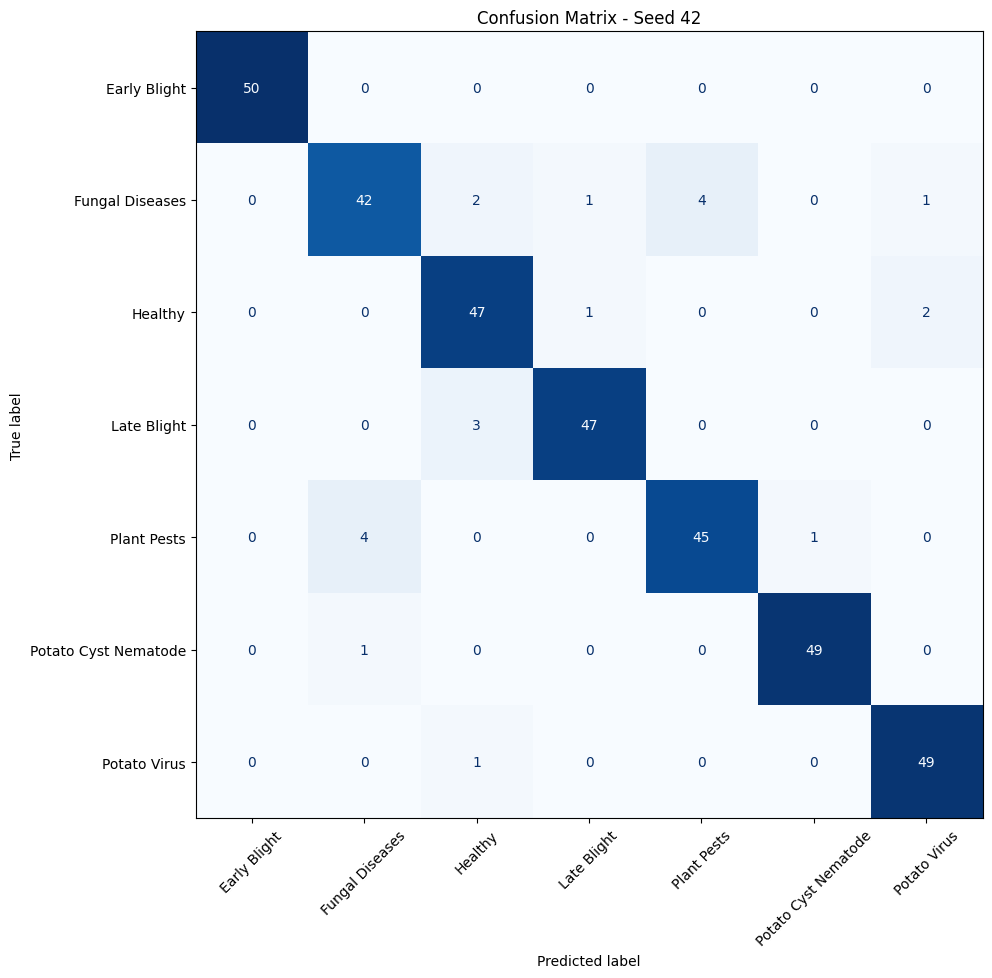

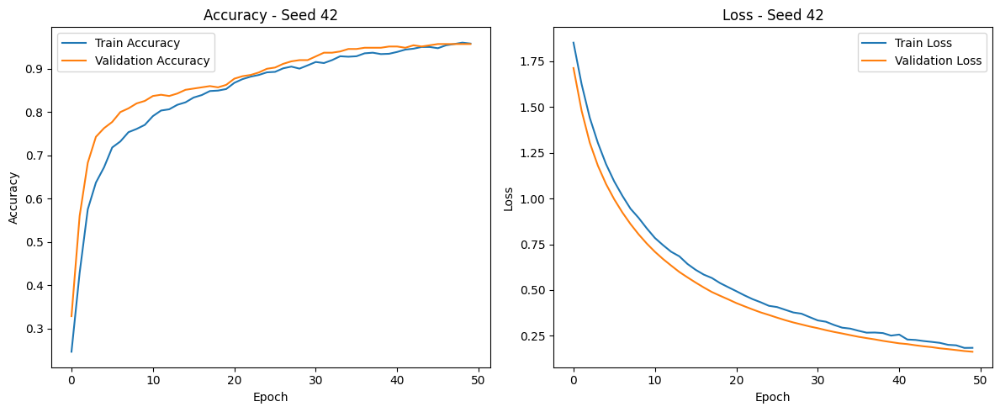


Running seed: 123
Train: 2800
Validation: 350
Test: 350
Class weights: {0: np.float64(1.0), 1: np.float64(1.0), 2: np.float64(1.0), 3: np.float64(1.0), 4: np.float64(1.0), 5: np.float64(1.0), 6: np.float64(1.0)}
Total parameters: 4,058,538
Trainable parameters: 1,359,927
Non-trainable parameters: 2,698,611.0
Epoch 1/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 54s 318ms/step - accuracy: 0.1357 - loss: 2.0008 - val_accuracy: 0.3229 - val_loss: 1.7907
Epoch 2/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.3400 - loss: 1.7577 - val_accuracy: 0.5114 - val_loss: 1.5519
Epoch 3/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step - accuracy: 0.4678 - loss: 1.5701 - val_accuracy: 0.5829 - val_loss: 1.3747
Epoch 4/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.5809 - loss: 1.3869 - val_accuracy: 0.6571 - val_loss: 1.2433
Epoch 5/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.6615 - loss: 1.2528 - val_accuracy: 0.6943 - val_loss: 1.1383
Epoch 6/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step -

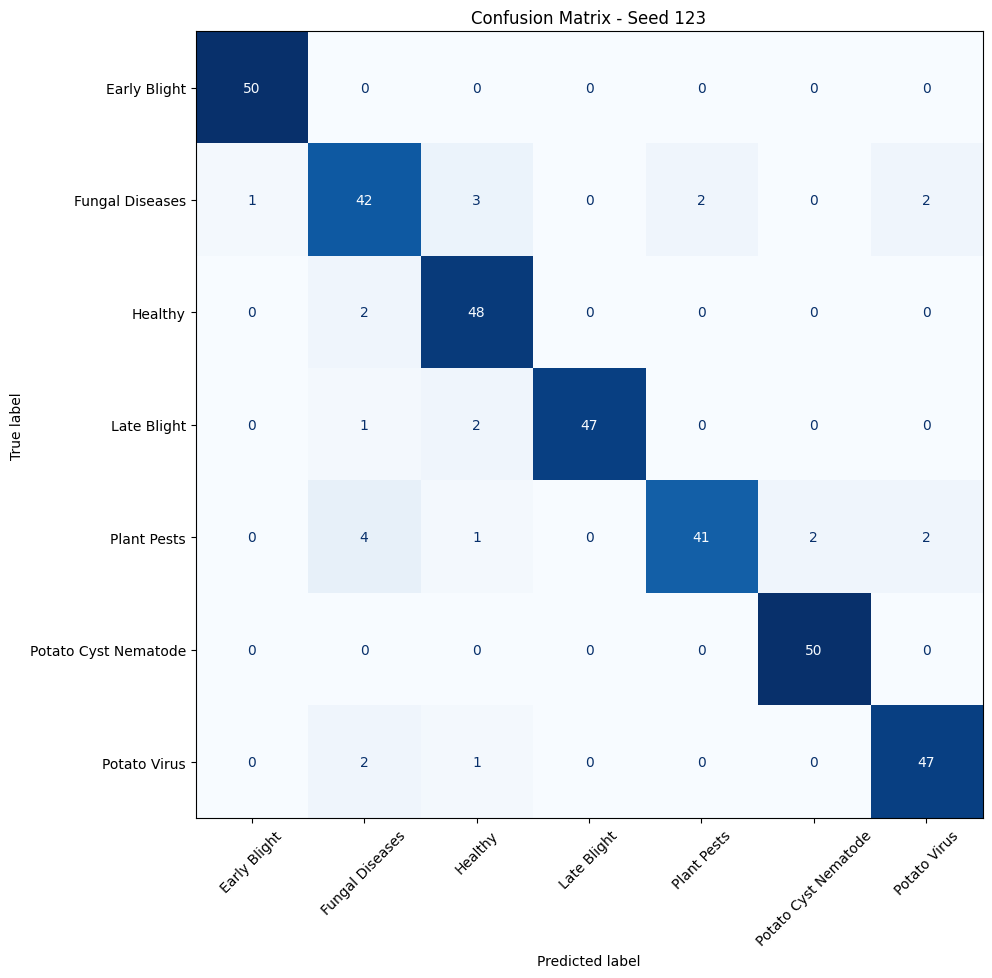

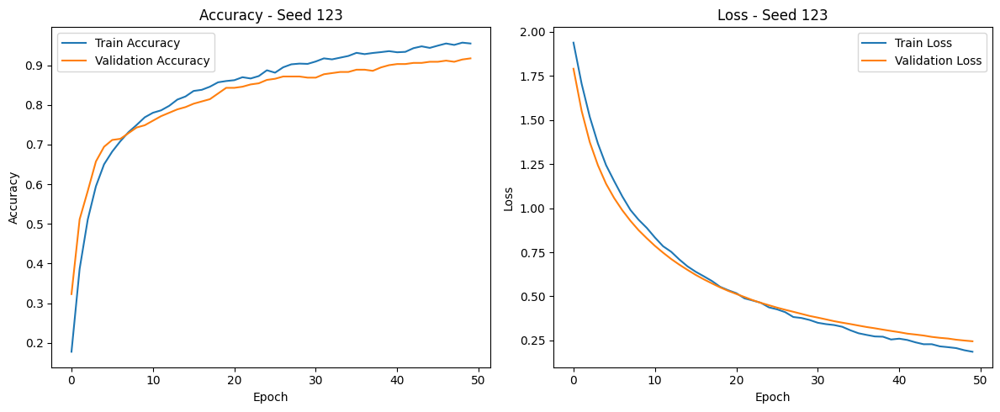


Running seed: 2024
Train: 2800
Validation: 350
Test: 350
Class weights: {0: np.float64(1.0), 1: np.float64(1.0), 2: np.float64(1.0), 3: np.float64(1.0), 4: np.float64(1.0), 5: np.float64(1.0), 6: np.float64(1.0)}
Total parameters: 4,058,538
Trainable parameters: 1,359,927
Non-trainable parameters: 2,698,611.0
Epoch 1/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 54s 315ms/step - accuracy: 0.1839 - loss: 1.9623 - val_accuracy: 0.3371 - val_loss: 1.7248
Epoch 2/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.3497 - loss: 1.7136 - val_accuracy: 0.4914 - val_loss: 1.5046
Epoch 3/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.4734 - loss: 1.5126 - val_accuracy: 0.6057 - val_loss: 1.3421
Epoch 4/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.5575 - loss: 1.3745 - val_accuracy: 0.6543 - val_loss: 1.2146
Epoch 5/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.6473 - loss: 1.2467 - val_accuracy: 0.6886 - val_loss: 1.1124
Epoch 6/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step 

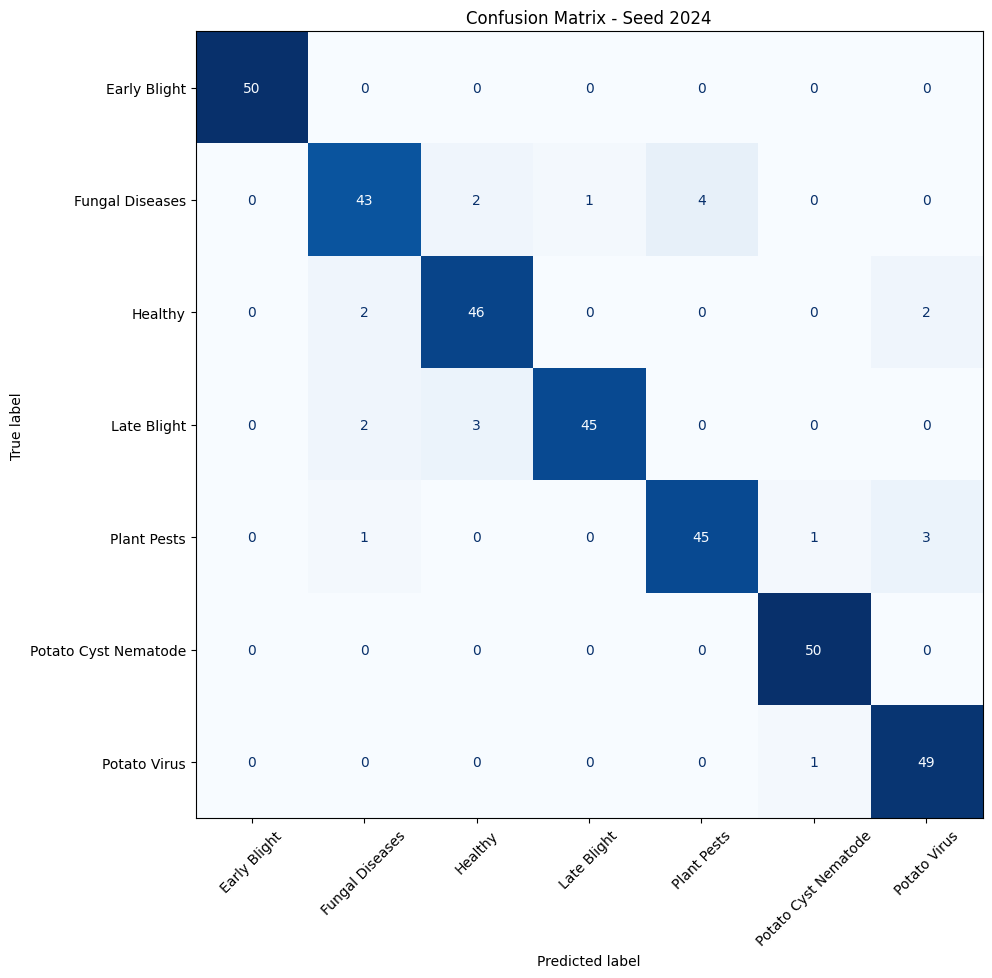

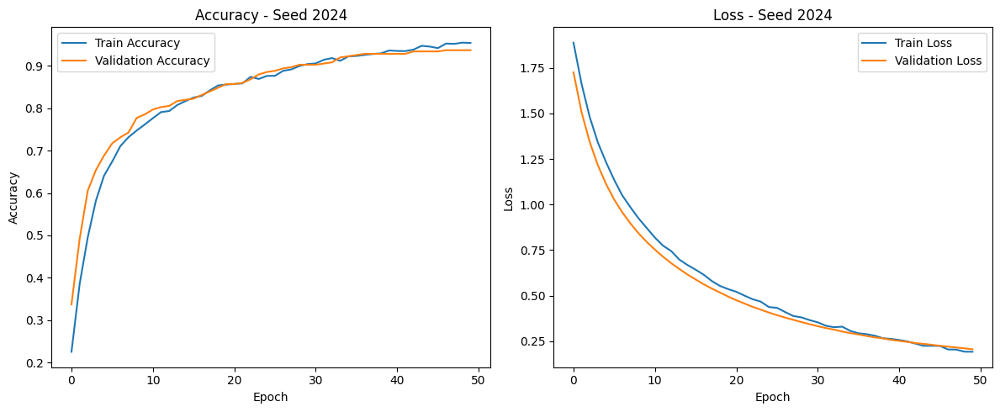


Running seed: 3407
Train: 2800
Validation: 350
Test: 350
Class weights: {0: np.float64(1.0), 1: np.float64(1.0), 2: np.float64(1.0), 3: np.float64(1.0), 4: np.float64(1.0), 5: np.float64(1.0), 6: np.float64(1.0)}
Total parameters: 4,058,538
Trainable parameters: 1,359,927
Non-trainable parameters: 2,698,611.0
Epoch 1/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 55s 325ms/step - accuracy: 0.1603 - loss: 1.9748 - val_accuracy: 0.3629 - val_loss: 1.7553
Epoch 2/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.3786 - loss: 1.7280 - val_accuracy: 0.5429 - val_loss: 1.5264
Epoch 3/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.5414 - loss: 1.5077 - val_accuracy: 0.6229 - val_loss: 1.3595
Epoch 4/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step - accuracy: 0.6053 - loss: 1.3695 - val_accuracy: 0.6829 - val_loss: 1.2339
Epoch 5/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.6674 - loss: 1.2162 - val_accuracy: 0.7057 - val_loss: 1.1319
Epoch 6/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step 

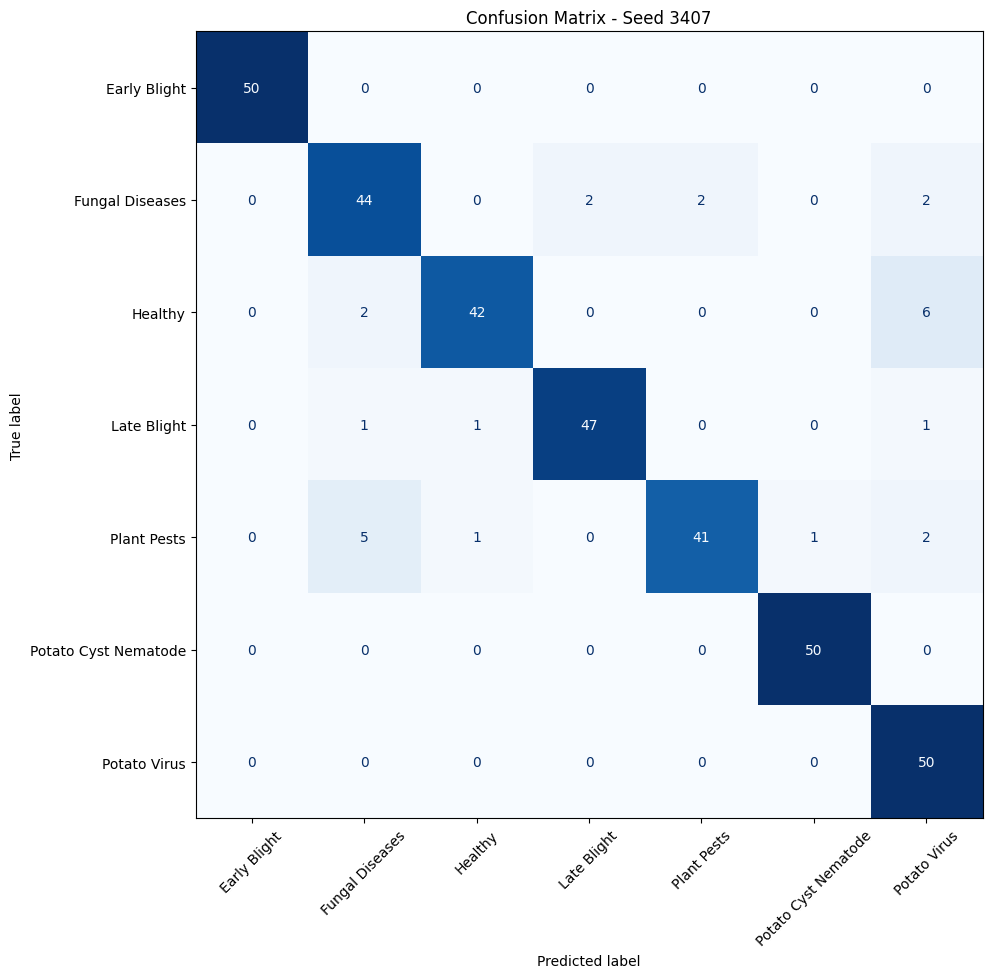

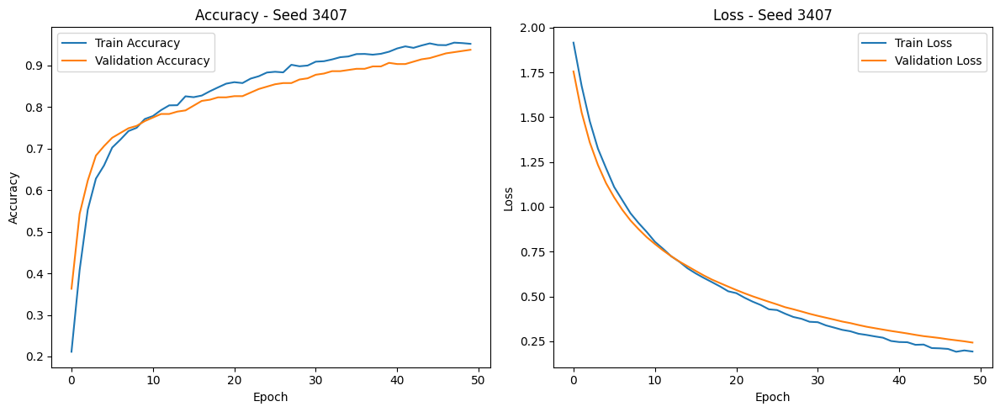


Running seed: 777
Train: 2800
Validation: 350
Test: 350
Class weights: {0: np.float64(1.0), 1: np.float64(1.0), 2: np.float64(1.0), 3: np.float64(1.0), 4: np.float64(1.0), 5: np.float64(1.0), 6: np.float64(1.0)}
Total parameters: 4,058,538
Trainable parameters: 1,359,927
Non-trainable parameters: 2,698,611.0
Epoch 1/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 54s 314ms/step - accuracy: 0.1645 - loss: 1.9729 - val_accuracy: 0.2857 - val_loss: 1.7805
Epoch 2/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.3411 - loss: 1.7249 - val_accuracy: 0.4771 - val_loss: 1.5501
Epoch 3/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.4958 - loss: 1.5350 - val_accuracy: 0.6057 - val_loss: 1.3788
Epoch 4/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.5905 - loss: 1.3609 - val_accuracy: 0.6629 - val_loss: 1.2490
Epoch 5/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.6503 - loss: 1.2667 - val_accuracy: 0.7000 - val_loss: 1.1456
Epoch 6/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step -

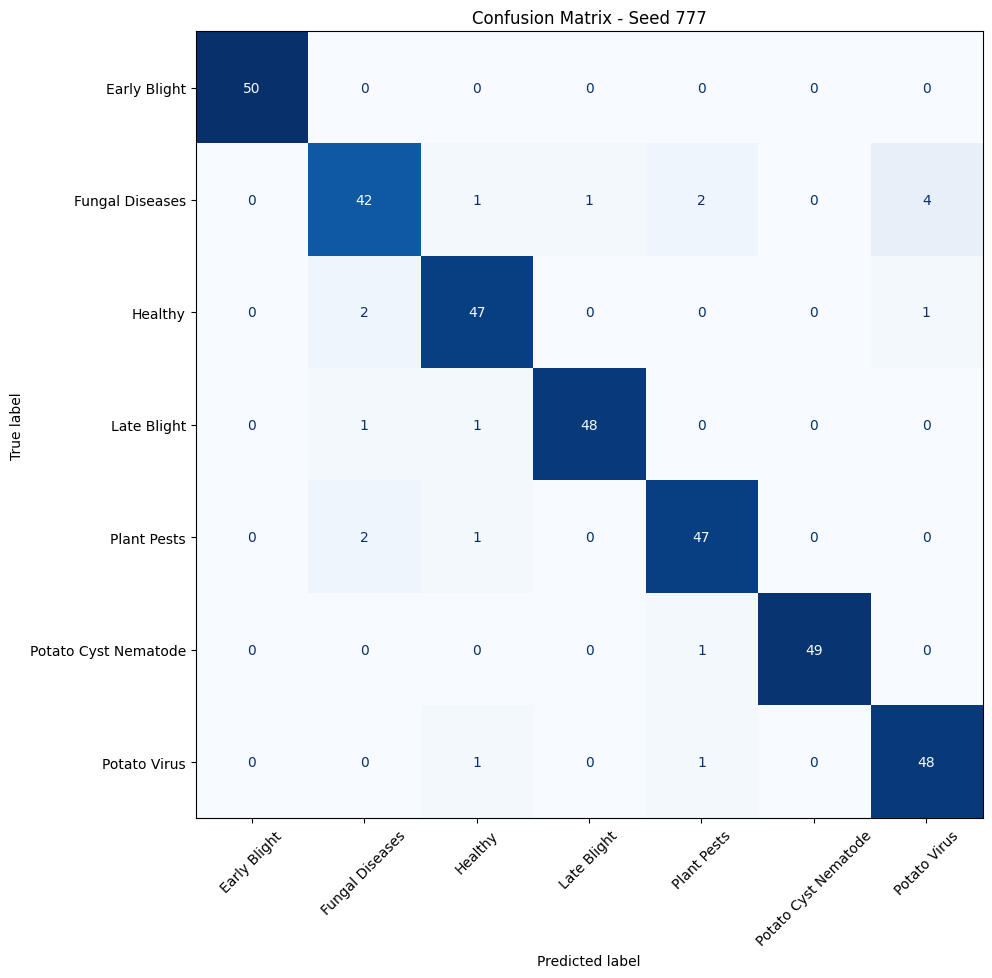

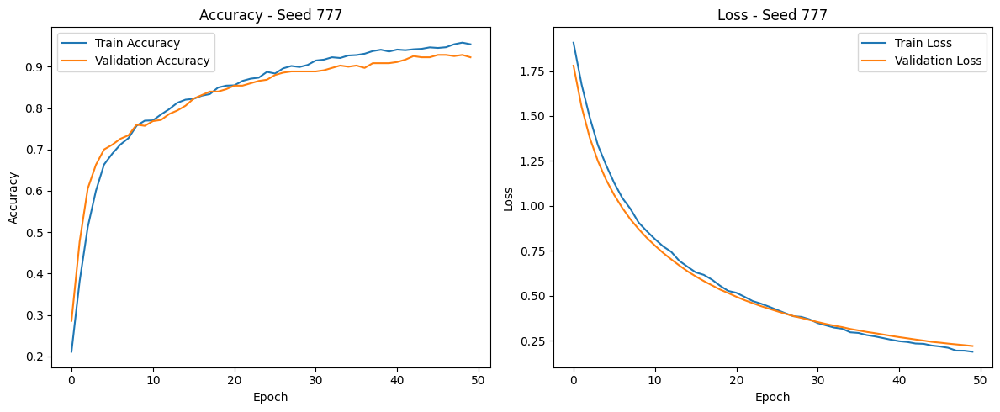


All seed results:
{'seed': 42, 'num_classes': 7, 'test_accuracy': 0.9399999976158142, 'test_loss': 0.20647485554218292, 'stopped_epoch': 50, 'best_epoch': 50, 'macro_precision': 0.9400383124032343, 'macro_recall': 0.9400000000000001, 'macro_f1': 0.9397101304254212, 'weighted_precision': 0.9400383124032344, 'weighted_recall': 0.94, 'weighted_f1': 0.9397101304254212, 'total_params': 4058538, 'trainable_params': np.int64(1359927), 'non_trainable_params': np.float64(2698611.0), 'model_path': 'models/EfficientNetB0_7class_seed_42.keras', 'history_path': 'history/EfficientNetB0_7class_seed_42_history.pkl', 'plot_path': 'history/EfficientNetB0_7class_seed_42_accuracy_loss.png', 'confusion_matrix_path': 'history/EfficientNetB0_7class_seed_42_confusion_matrix.png', 'classification_report_path': 'reports/EfficientNetB0_7class_seed_42_classification_report.json'}
{'seed': 123, 'num_classes': 7, 'test_accuracy': 0.9285714030265808, 'test_loss': 0.19770868122577667, 'stopped_epoch': 50, 'best_epoc

In [10]:
all_results = []

for seed in SEEDS:
    result = run_single_seed(seed)
    all_results.append(result)

print("\nAll seed results:")
for result in all_results:
    print(result)


In [11]:
results_df = pd.DataFrame(all_results)

csv_path = f"{EXPERIMENT_NAME}_multiseed_results.csv"
results_df.to_csv(csv_path, index=False)

print("Saved results to:", csv_path)
results_df


Saved results to: EfficientNetB0_7class_multiseed_results.csv


,seed,num_classes,test_accuracy,test_loss,stopped_epoch,best_epoch,macro_precision,macro_recall,macro_f1,weighted_precision,weighted_recall,weighted_f1,total_params,trainable_params,non_trainable_params,model_path,history_path,plot_path,confusion_matrix_path,classification_report_path
0,42,7,0.940000,0.206475,50,50,0.940038,0.940000,0.939710,0.940038,0.940000,0.939710,4058538,1359927,2698611.0,models/EfficientNetB0_7class_seed_42.keras,history/EfficientNetB0_7class_seed_42_history.pkl,history/EfficientNetB0_7class_seed_42_accuracy...,history/EfficientNetB0_7class_seed_42_confusio...,reports/EfficientNetB0_7class_seed_42_classifi...
1,123,7,0.928571,0.197709,50,50,0.930463,0.928571,0.928278,0.930463,0.928571,0.928278,4058538,1359927,2698611.0,models/EfficientNetB0_7class_seed_123.keras,history/EfficientNetB0_7class_seed_123_history...,history/EfficientNetB0_7class_seed_123_accurac...,history/EfficientNetB0_7class_seed_123_confusi...,reports/EfficientNetB0_7class_seed_123_classif...
2,2024,7,0.937143,0.205300,50,50,0.937624,0.937143,0.936819,0.937624,0.937143,0.936819,4058538,1359927,2698611.0,models/EfficientNetB0_7class_seed_2024.keras,history/EfficientNetB0_7class_seed_2024_histor...,history/EfficientNetB0_7class_seed_2024_accura...,history/EfficientNetB0_7class_seed_2024_confus...,reports/EfficientNetB0_7class_seed_2024_classi...
3,3407,7,0.925714,0.200426,50,50,0.930491,0.925714,0.925511,0.930491,0.925714,0.925511,4058538,1359927,2698611.0,models/EfficientNetB0_7class_seed_3407.keras,history/EfficientNetB0_7class_seed_3407_histor...,history/EfficientNetB0_7class_seed_3407_accura...,history/EfficientNetB0_7class_seed_3407_confus...,reports/EfficientNetB0_7class_seed_3407_classi...
4,777,7,0.945714,0.186558,50,50,0.946001,0.945714,0.945571,0.946001,0.945714,0.945571,4058538,1359927,2698611.0,models/EfficientNetB0_7class_seed_777.keras,history/EfficientNetB0_7class_seed_777_history...,history/EfficientNetB0_7class_seed_777_accurac...,history/EfficientNetB0_7class_seed_777_confusi...,reports/EfficientNetB0_7class_seed_777_classif...


In [12]:
metrics = [
    "test_accuracy",
    "test_loss",
    "macro_precision",
    "macro_recall",
    "macro_f1",
    "weighted_precision",
    "weighted_recall",
    "weighted_f1",
    "stopped_epoch",
    "best_epoch"
]

summary_rows = []

for metric in metrics:
    values = results_df[metric].astype(float).values

    summary_rows.append({
        "metric": metric,
        "mean": np.mean(values),
        "std": np.std(values),
        "min": np.min(values),
        "max": np.max(values)
    })

summary_df = pd.DataFrame(summary_rows)

summary_csv_path = f"{EXPERIMENT_NAME}_multiseed_summary.csv"
summary_df.to_csv(summary_csv_path, index=False)

print("Multi-seed summary report")
print("=" * 70)
display(summary_df)

print("Saved summary report to:", summary_csv_path)

print("\nPaper-style summary:")
print(f"Accuracy: {results_df['test_accuracy'].mean():.4f} ± {results_df['test_accuracy'].std(ddof=0):.4f}")
print(f"Loss: {results_df['test_loss'].mean():.4f} ± {results_df['test_loss'].std(ddof=0):.4f}")
print(f"Macro F1: {results_df['macro_f1'].mean():.4f} ± {results_df['macro_f1'].std(ddof=0):.4f}")
print(f"Weighted F1: {results_df['weighted_f1'].mean():.4f} ± {results_df['weighted_f1'].std(ddof=0):.4f}")


Multi-seed summary report


,metric,mean,std,min,max
0,test_accuracy,0.935429,0.007362,0.925714,0.945714
1,test_loss,0.199294,0.007122,0.186558,0.206475
2,macro_precision,0.936924,0.005928,0.930463,0.946001
3,macro_recall,0.935429,0.007362,0.925714,0.945714
4,macro_f1,0.935178,0.007380,0.925511,0.945571
5,weighted_precision,0.936924,0.005928,0.930463,0.946001
6,weighted_recall,0.935429,0.007362,0.925714,0.945714
7,weighted_f1,0.935178,0.007380,0.925511,0.945571
8,stopped_epoch,50.000000,0.000000,50.000000,50.000000
9,best_epoch,50.000000,0.000000,50.000000,50.000000


Saved summary report to: EfficientNetB0_7class_multiseed_summary.csv

Paper-style summary:
Accuracy: 0.9354 ± 0.0074
Loss: 0.1993 ± 0.0071
Macro F1: 0.9352 ± 0.0074
Weighted F1: 0.9352 ± 0.0074


In [13]:
mean_acc = results_df["test_accuracy"].mean()

results_df["distance_from_mean_accuracy"] = (
    results_df["test_accuracy"] - mean_acc
).abs()

representative_row = results_df.sort_values("distance_from_mean_accuracy").iloc[0]

MODEL_PATH = representative_row["model_path"]
SEED_TO_ANALYZE = int(representative_row["seed"])

print("Mean accuracy:", mean_acc)
print("Representative seed:", SEED_TO_ANALYZE)
print("Representative model:", MODEL_PATH)

representative_row


Mean accuracy: 0.9354285717010498
Representative seed: 2024
Representative model: models/EfficientNetB0_7class_seed_2024.keras


seed                                                                        2024
num_classes                                                                    7
test_accuracy                                                           0.937143
test_loss                                                                 0.2053
stopped_epoch                                                                 50
best_epoch                                                                    50
macro_precision                                                         0.937624
macro_recall                                                            0.937143
macro_f1                                                                0.936819
weighted_precision                                                      0.937624
weighted_recall                                                         0.937143
weighted_f1                                                             0.936819
total_params                

In [14]:
from tensorflow.keras.models import load_model

MODEL_TYPE = "efficientnet"
IMAGE_SIZE = (224, 224)

model = load_model(MODEL_PATH)

print("Loaded model:", MODEL_PATH)


Loaded model: models/EfficientNetB0_7class_seed_2024.keras


In [15]:
X_train, X_temp, y_train, y_temp = train_test_split(
    file_paths,
    labels,
    test_size=0.20,
    stratify=labels,
    random_state=SEED_TO_ANALYZE
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp,
    y_temp,
    test_size=0.50,
    stratify=y_temp,
    random_state=SEED_TO_ANALYZE
)

print("Test images:", len(X_test))


Test images: 350


In [16]:
def load_image_for_model(image_path):
    image_raw = tf.io.read_file(image_path)
    image = tf.image.decode_image(image_raw, channels=3, expand_animations=False)
    image.set_shape([None, None, 3])

    image = tf.image.resize(image, IMAGE_SIZE)
    image = tf.cast(image, tf.float32)

    original_image = image.numpy().astype(np.uint8)

    processed_image = preprocess_input(image)
    processed_image = tf.expand_dims(processed_image, axis=0)

    return processed_image, original_image


idx_to_class = {i: name for i, name in enumerate(class_names)}
class_to_idx = {name: i for i, name in enumerate(class_names)}

records = []

for image_path, true_label in zip(X_test, y_test):
    processed_image, _ = load_image_for_model(image_path)
    probs = model.predict(processed_image, verbose=0)[0]

    pred_label = int(np.argmax(probs))
    confidence = float(np.max(probs))

    records.append({
        "image_path": image_path,
        "true_label": int(true_label),
        "true_class": idx_to_class[int(true_label)],
        "predicted_label": pred_label,
        "pred_class": idx_to_class[pred_label],
        "confidence": confidence,
        "correct": int(true_label) == pred_label
    })

pred_df = pd.DataFrame(records)

pred_csv_path = f"test_predictions_{MODEL_TYPE}_{NUM_CLASSES}class_seed_{SEED_TO_ANALYZE}.csv"
pred_df.to_csv(pred_csv_path, index=False)

print("Saved predictions to:", pred_csv_path)
pred_df.head()


Saved predictions to: test_predictions_efficientnet_7class_seed_2024.csv


,image_path,true_label,true_class,predicted_label,pred_class,confidence,correct
0,/kaggle/input/datasets/shahadhossin567r7455/po...,0,Early Blight,0,Early Blight,0.995614,True
1,/kaggle/input/datasets/shahadhossin567r7455/po...,6,Potato Virus,6,Potato Virus,0.725377,True
2,/kaggle/input/datasets/shahadhossin567r7455/po...,4,Plant Pests,4,Plant Pests,0.957226,True
3,/kaggle/input/datasets/shahadhossin567r7455/po...,3,Late Blight,3,Late Blight,0.988216,True
4,/kaggle/input/datasets/shahadhossin567r7455/po...,2,Healthy,2,Healthy,0.865137,True


In [17]:
def assign_three_way_region(confidence):
    if confidence >= 0.90:
        return "Accept"
    elif confidence >= 0.60:
        return "Defer"
    else:
        return "Reject"


twd_df = pred_df.copy()
twd_df["decision_region"] = twd_df["confidence"].apply(assign_three_way_region)

twd_df.head()


,image_path,true_label,true_class,predicted_label,pred_class,confidence,correct,decision_region
0,/kaggle/input/datasets/shahadhossin567r7455/po...,0,Early Blight,0,Early Blight,0.995614,True,Accept
1,/kaggle/input/datasets/shahadhossin567r7455/po...,6,Potato Virus,6,Potato Virus,0.725377,True,Defer
2,/kaggle/input/datasets/shahadhossin567r7455/po...,4,Plant Pests,4,Plant Pests,0.957226,True,Accept
3,/kaggle/input/datasets/shahadhossin567r7455/po...,3,Late Blight,3,Late Blight,0.988216,True,Accept
4,/kaggle/input/datasets/shahadhossin567r7455/po...,2,Healthy,2,Healthy,0.865137,True,Defer


In [18]:
total_samples = len(twd_df)

region_counts = twd_df["decision_region"].value_counts().reindex(
    ["Accept", "Defer", "Reject"],
    fill_value=0
)

region_percentages = (region_counts / total_samples) * 100

print("Three-way decision counts:")
for region in ["Accept", "Defer", "Reject"]:
    print(f"{region}: {region_counts[region]} samples ({region_percentages[region]:.2f}%)")

accept_df = twd_df[twd_df["decision_region"] == "Accept"]

if len(accept_df) > 0:
    accept_accuracy = accept_df["correct"].mean()
    accept_error_rate = 1.0 - accept_accuracy
else:
    accept_accuracy = np.nan
    accept_error_rate = np.nan

wrong_df = twd_df[twd_df["correct"] == False]
wrong_captured_df = wrong_df[
    wrong_df["decision_region"].isin(["Defer", "Reject"])
]

num_wrong_total = len(wrong_df)
num_wrong_captured = len(wrong_captured_df)

if num_wrong_total > 0:
    wrong_capture_rate = num_wrong_captured / num_wrong_total
else:
    wrong_capture_rate = np.nan

print("\nAccept region:")
print(f"Accept accuracy: {accept_accuracy:.4f}")
print(f"Accept error rate: {accept_error_rate:.4f}")

print("\nWrong prediction analysis:")
print(f"Total wrong predictions: {num_wrong_total}")
print(f"Wrong predictions captured by Defer/Reject: {num_wrong_captured}")
print(f"Wrong capture rate: {wrong_capture_rate:.4f}")


Three-way decision counts:
Accept: 253 samples (72.29%)
Defer: 67 samples (19.14%)
Reject: 30 samples (8.57%)

Accept region:
Accept accuracy: 0.9960
Accept error rate: 0.0040

Wrong prediction analysis:
Total wrong predictions: 22
Wrong predictions captured by Defer/Reject: 21
Wrong capture rate: 0.9545


In [19]:
class_region_counts = pd.crosstab(
    twd_df["true_class"],
    twd_df["decision_region"]
).reindex(columns=["Accept", "Defer", "Reject"], fill_value=0)

class_region_percentages = class_region_counts.div(
    class_region_counts.sum(axis=1),
    axis=0
) * 100

print("Class-wise Accept / Defer / Reject counts:")
display(class_region_counts)

print("Class-wise Accept / Defer / Reject percentages:")
display(class_region_percentages.round(2))


Class-wise Accept / Defer / Reject counts:


decision_region,Accept,Defer,Reject
true_class,,,
Early Blight,49,1,0
Fungal Diseases,22,19,9
Healthy,32,11,7
Late Blight,39,5,6
Plant Pests,29,16,5
Potato Cyst Nematode,48,2,0
Potato Virus,34,13,3


Class-wise Accept / Defer / Reject percentages:


decision_region,Accept,Defer,Reject
true_class,,,
Early Blight,98.0,2.0,0.0
Fungal Diseases,44.0,38.0,18.0
Healthy,64.0,22.0,14.0
Late Blight,78.0,10.0,12.0
Plant Pests,58.0,32.0,10.0
Potato Cyst Nematode,96.0,4.0,0.0
Potato Virus,68.0,26.0,6.0


In [20]:
three_way_csv = f"three_way_decision_{MODEL_TYPE}_{NUM_CLASSES}class_seed_{SEED_TO_ANALYZE}.csv"
twd_df.to_csv(three_way_csv, index=False)

summary = {
    "total_samples": total_samples,
    "accept_count": int(region_counts["Accept"]),
    "defer_count": int(region_counts["Defer"]),
    "reject_count": int(region_counts["Reject"]),
    "accept_percentage": float(region_percentages["Accept"]),
    "defer_percentage": float(region_percentages["Defer"]),
    "reject_percentage": float(region_percentages["Reject"]),
    "accept_accuracy": float(accept_accuracy),
    "accept_error_rate": float(accept_error_rate),
    "total_wrong_predictions": int(num_wrong_total),
    "wrong_predictions_captured_by_defer_reject": int(num_wrong_captured),
    "wrong_capture_rate": float(wrong_capture_rate)
}

summary_df = pd.DataFrame([summary])

summary_csv = f"three_way_decision_summary_{MODEL_TYPE}_{NUM_CLASSES}class_seed_{SEED_TO_ANALYZE}.csv"
summary_df.to_csv(summary_csv, index=False)

print("Saved:", three_way_csv)
print("Saved:", summary_csv)

summary_df


Saved: three_way_decision_efficientnet_7class_seed_2024.csv
Saved: three_way_decision_summary_efficientnet_7class_seed_2024.csv


,total_samples,accept_count,defer_count,reject_count,accept_percentage,defer_percentage,reject_percentage,accept_accuracy,accept_error_rate,total_wrong_predictions,wrong_predictions_captured_by_defer_reject,wrong_capture_rate
0,350,253,67,30,72.285714,19.142857,8.571429,0.996047,0.003953,22,21,0.954545


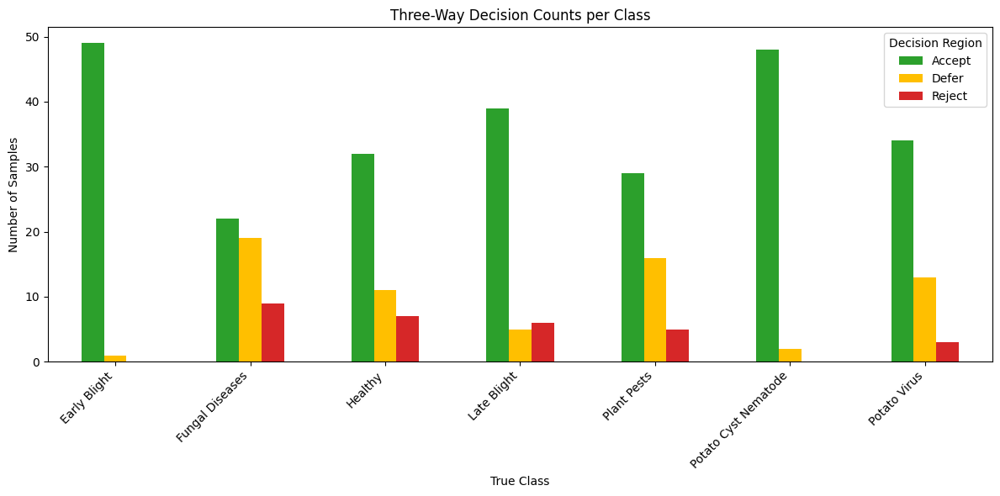

Saved: three_way_decision_counts_efficientnet_7class_seed_2024.png


In [21]:
ax = class_region_counts.plot(
    kind="bar",
    figsize=(12, 6),
    color=["#2ca02c", "#ffbf00", "#d62728"]
)

ax.set_title("Three-Way Decision Counts per Class")
ax.set_xlabel("True Class")
ax.set_ylabel("Number of Samples")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Decision Region")
plt.tight_layout()

three_way_plot = f"three_way_decision_counts_{MODEL_TYPE}_{NUM_CLASSES}class_seed_{SEED_TO_ANALYZE}.png"
plt.savefig(three_way_plot, dpi=300)
plt.show()

print("Saved:", three_way_plot)


In [22]:
SAMPLES_PER_GROUP = 3

OUTPUT_DIR = f"gradcam_{MODEL_TYPE}_{NUM_CLASSES}class_seed_{SEED_TO_ANALYZE}"
os.makedirs(OUTPUT_DIR, exist_ok=True)

print("Grad-CAM output folder:", OUTPUT_DIR)
print("Class names:", class_names)


Grad-CAM output folder: gradcam_efficientnet_7class_seed_2024
Class names: ['Early Blight', 'Fungal Diseases', 'Healthy', 'Late Blight', 'Plant Pests', 'Potato Cyst Nematode', 'Potato Virus']


In [23]:
analysis_groups = {
    "correct_fungal_diseases": {
        "true": "Fungal Diseases",
        "pred": "Fungal Diseases"
    },
    "fungal_diseases_as_plant_pests": {
        "true": "Fungal Diseases",
        "pred": "Plant Pests"
    },
    "plant_pests_as_fungal_diseases": {
        "true": "Plant Pests",
        "pred": "Fungal Diseases"
    },
    "healthy_as_potato_virus": {
        "true": "Healthy",
        "pred": "Potato Virus"
    },
    "potato_virus_as_healthy": {
        "true": "Potato Virus",
        "pred": "Healthy"
    },
    "correct_early_blight": {
        "true": "Early Blight",
        "pred": "Early Blight"
    },
    "correct_late_blight": {
        "true": "Late Blight",
        "pred": "Late Blight"
    }
}

selected_samples = []

for group_name, rule in analysis_groups.items():
    group_df = pred_df[
        (pred_df["true_class"] == rule["true"]) &
        (pred_df["pred_class"] == rule["pred"])
    ].copy()

    group_df = group_df.sort_values("confidence", ascending=False)
    group_df = group_df.head(SAMPLES_PER_GROUP)

    print(f"{group_name}: selected {len(group_df)} samples")

    for _, row in group_df.iterrows():
        sample = row.to_dict()
        sample["group"] = group_name
        selected_samples.append(sample)

selected_df = pd.DataFrame(selected_samples)

selected_csv_path = os.path.join(OUTPUT_DIR, "selected_gradcam_samples.csv")
selected_df.to_csv(selected_csv_path, index=False)

print("Saved selected samples to:", selected_csv_path)
selected_df


correct_fungal_diseases: selected 3 samples
fungal_diseases_as_plant_pests: selected 3 samples
plant_pests_as_fungal_diseases: selected 1 samples
healthy_as_potato_virus: selected 2 samples
potato_virus_as_healthy: selected 0 samples
correct_early_blight: selected 3 samples
correct_late_blight: selected 3 samples
Saved selected samples to: gradcam_efficientnet_7class_seed_2024/selected_gradcam_samples.csv


,image_path,true_label,true_class,predicted_label,pred_class,confidence,correct,group
0,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,1,Fungal Diseases,0.996098,True,correct_fungal_diseases
1,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,1,Fungal Diseases,0.995148,True,correct_fungal_diseases
2,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,1,Fungal Diseases,0.994944,True,correct_fungal_diseases
3,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,4,Plant Pests,0.675797,False,fungal_diseases_as_plant_pests
4,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,4,Plant Pests,0.586638,False,fungal_diseases_as_plant_pests
5,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,4,Plant Pests,0.512896,False,fungal_diseases_as_plant_pests
6,/kaggle/input/datasets/shahadhossin567r7455/po...,4,Plant Pests,1,Fungal Diseases,0.648995,False,plant_pests_as_fungal_diseases
7,/kaggle/input/datasets/shahadhossin567r7455/po...,2,Healthy,6,Potato Virus,0.808366,False,healthy_as_potato_virus
8,/kaggle/input/datasets/shahadhossin567r7455/po...,2,Healthy,6,Potato Virus,0.536036,False,healthy_as_potato_virus
9,/kaggle/input/datasets/shahadhossin567r7455/po...,0,Early Blight,0,Early Blight,0.999741,True,correct_early_blight


In [24]:
analysis_groups = {
    "correct_fungal_diseases": {
        "true": "Fungal Diseases",
        "pred": "Fungal Diseases"
    },
    "fungal_diseases_as_plant_pests": {
        "true": "Fungal Diseases",
        "pred": "Plant Pests"
    },
    "plant_pests_as_fungal_diseases": {
        "true": "Plant Pests",
        "pred": "Fungal Diseases"
    },
    "healthy_as_potato_virus": {
        "true": "Healthy",
        "pred": "Potato Virus"
    },
    "potato_virus_as_healthy": {
        "true": "Potato Virus",
        "pred": "Healthy"
    },
    "correct_early_blight": {
        "true": "Early Blight",
        "pred": "Early Blight"
    },
    "correct_late_blight": {
        "true": "Late Blight",
        "pred": "Late Blight"
    }
}

selected_samples = []

for group_name, rule in analysis_groups.items():
    group_df = pred_df[
        (pred_df["true_class"] == rule["true"]) &
        (pred_df["pred_class"] == rule["pred"])
    ].copy()

    group_df = group_df.sort_values("confidence", ascending=False)
    group_df = group_df.head(SAMPLES_PER_GROUP)

    print(f"{group_name}: selected {len(group_df)} samples")

    for _, row in group_df.iterrows():
        sample = row.to_dict()
        sample["group"] = group_name
        selected_samples.append(sample)

selected_df = pd.DataFrame(selected_samples)

selected_csv_path = os.path.join(OUTPUT_DIR, "selected_gradcam_samples.csv")
selected_df.to_csv(selected_csv_path, index=False)

print("Saved selected samples to:", selected_csv_path)
selected_df


correct_fungal_diseases: selected 3 samples
fungal_diseases_as_plant_pests: selected 3 samples
plant_pests_as_fungal_diseases: selected 1 samples
healthy_as_potato_virus: selected 2 samples
potato_virus_as_healthy: selected 0 samples
correct_early_blight: selected 3 samples
correct_late_blight: selected 3 samples
Saved selected samples to: gradcam_efficientnet_7class_seed_2024/selected_gradcam_samples.csv


,image_path,true_label,true_class,predicted_label,pred_class,confidence,correct,group
0,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,1,Fungal Diseases,0.996098,True,correct_fungal_diseases
1,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,1,Fungal Diseases,0.995148,True,correct_fungal_diseases
2,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,1,Fungal Diseases,0.994944,True,correct_fungal_diseases
3,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,4,Plant Pests,0.675797,False,fungal_diseases_as_plant_pests
4,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,4,Plant Pests,0.586638,False,fungal_diseases_as_plant_pests
5,/kaggle/input/datasets/shahadhossin567r7455/po...,1,Fungal Diseases,4,Plant Pests,0.512896,False,fungal_diseases_as_plant_pests
6,/kaggle/input/datasets/shahadhossin567r7455/po...,4,Plant Pests,1,Fungal Diseases,0.648995,False,plant_pests_as_fungal_diseases
7,/kaggle/input/datasets/shahadhossin567r7455/po...,2,Healthy,6,Potato Virus,0.808366,False,healthy_as_potato_virus
8,/kaggle/input/datasets/shahadhossin567r7455/po...,2,Healthy,6,Potato Virus,0.536036,False,healthy_as_potato_virus
9,/kaggle/input/datasets/shahadhossin567r7455/po...,0,Early Blight,0,Early Blight,0.999741,True,correct_early_blight


In [25]:
def find_last_conv_layer(model):
    conv_layer_names = []

    for layer in model.layers:
        if isinstance(layer, tf.keras.layers.Conv2D):
            conv_layer_names.append(layer.name)

    if len(conv_layer_names) == 0:
        raise ValueError("No Conv2D layer found in the model.")

    return conv_layer_names[-1]


last_conv_layer_name = find_last_conv_layer(model)
print("Detected last convolutional layer:", last_conv_layer_name)

dummy_input = tf.zeros((1, IMAGE_SIZE[0], IMAGE_SIZE[1], 3))
_ = model(dummy_input)

gradcam_model = tf.keras.models.Model(
    inputs=model.inputs,
    outputs=[
        model.get_layer(last_conv_layer_name).output,
        model.outputs[0]
    ]
)

print("Grad-CAM model created successfully.")


Detected last convolutional layer: top_conv
Grad-CAM model created successfully.


In [26]:
def make_gradcam_heatmap(processed_image, gradcam_model, class_index=None):
    with tf.GradientTape() as tape:
        conv_outputs, predictions = gradcam_model(processed_image)

        if class_index is None:
            class_index = tf.argmax(predictions[0])

        class_score = predictions[:, class_index]

    grads = tape.gradient(class_score, conv_outputs)

    if grads is None:
        raise ValueError("Gradients are None. Grad-CAM graph is disconnected.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0)
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)

    return heatmap.numpy()


def overlay_heatmap(original_image, heatmap, alpha=0.4, cmap="jet"):
    heatmap_resized = tf.image.resize(
        heatmap[..., np.newaxis],
        (original_image.shape[0], original_image.shape[1])
    ).numpy().squeeze()

    colormap = plt.get_cmap(cmap)
    colored_heatmap = colormap(heatmap_resized)[:, :, :3]
    colored_heatmap = np.uint8(255 * colored_heatmap)

    overlay = np.uint8(
        alpha * colored_heatmap + (1 - alpha) * original_image
    )

    return overlay


def save_gradcam_figure(sample):
    image_path = sample["image_path"]
    true_class = sample["true_class"]
    pred_class = sample["pred_class"]
    confidence = sample["confidence"]
    group = sample["group"]

    processed_image, original_image = load_image_for_model(image_path)

    pred_index = class_to_idx[pred_class]

    heatmap = make_gradcam_heatmap(
        processed_image=processed_image,
        gradcam_model=gradcam_model,
        class_index=pred_index
    )

    overlay = overlay_heatmap(original_image, heatmap, alpha=0.4)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(original_image)
    axes[0].set_title("Original")
    axes[0].axis("off")

    axes[1].imshow(overlay)
    axes[1].set_title("Grad-CAM Overlay")
    axes[1].axis("off")

    title = (
        f"Group: {group}\n"
        f"True: {true_class} | Predicted: {pred_class} | Confidence: {confidence:.4f}"
    )

    fig.suptitle(title, fontsize=12)
    plt.tight_layout()

    safe_name = os.path.basename(image_path).replace(".", "_")
    save_path = os.path.join(
        OUTPUT_DIR,
        f"{group}_{safe_name}_gradcam.png"
    )

    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close()

    return save_path


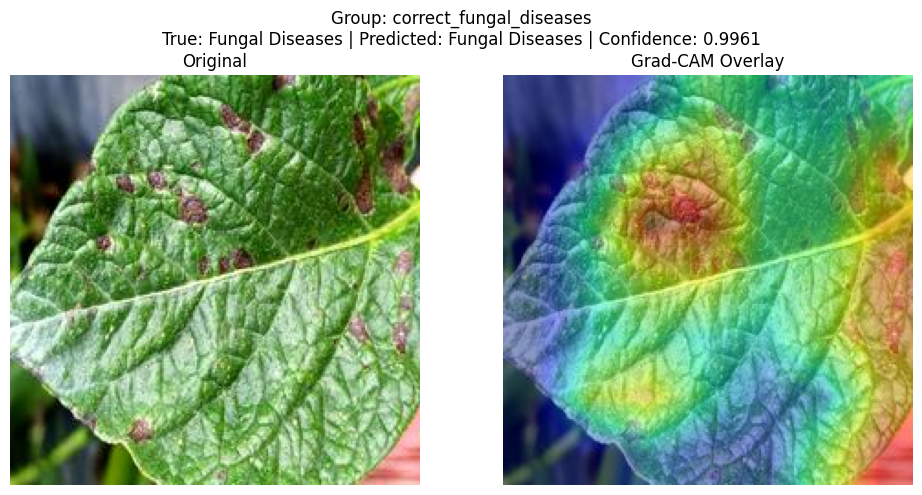

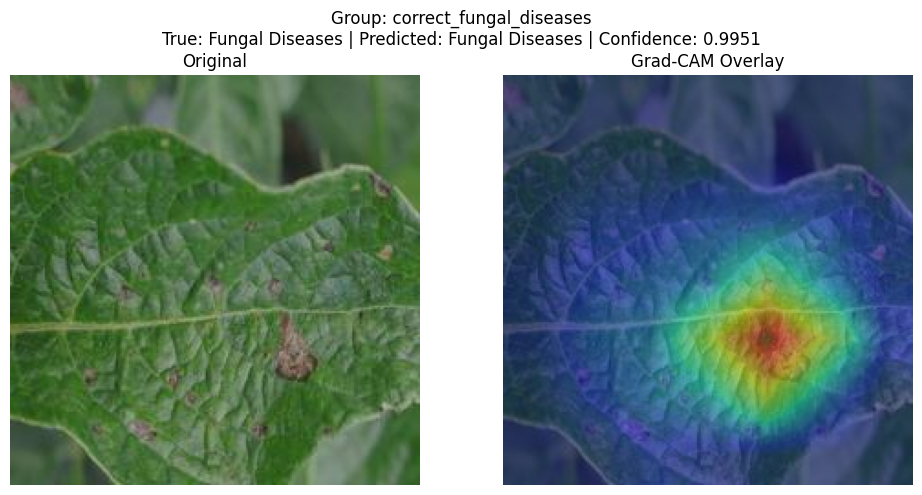

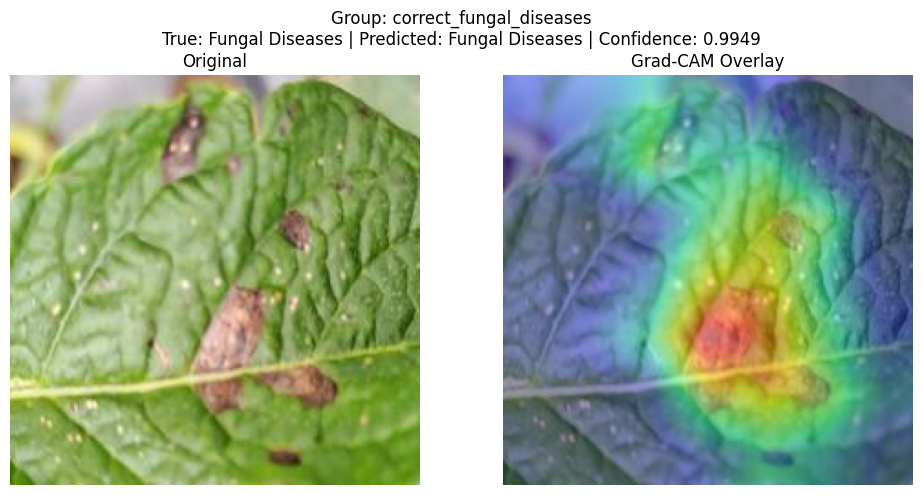

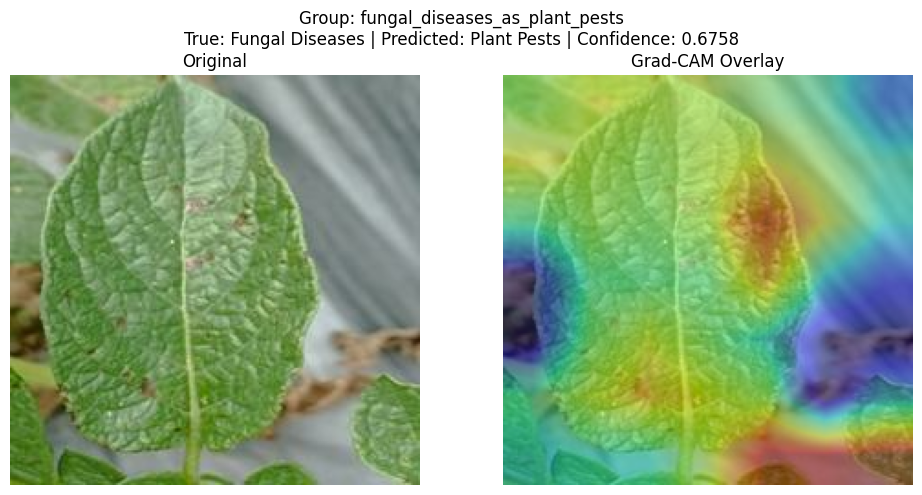

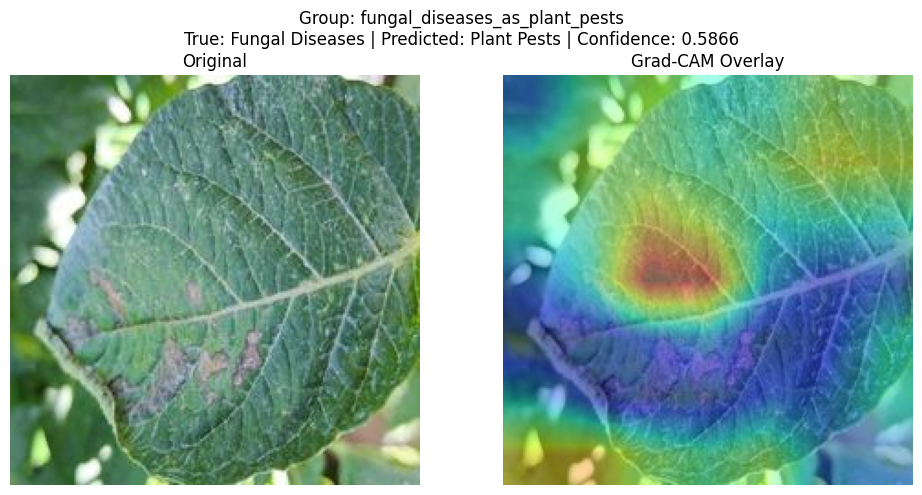

...

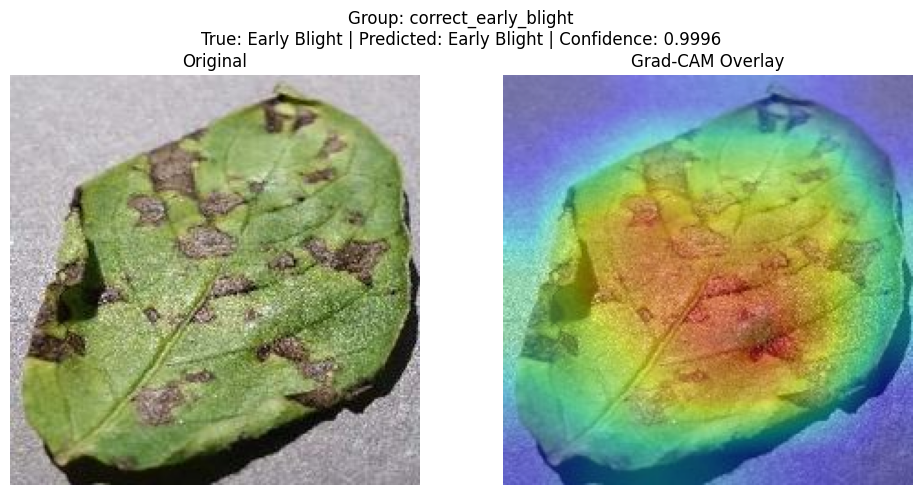

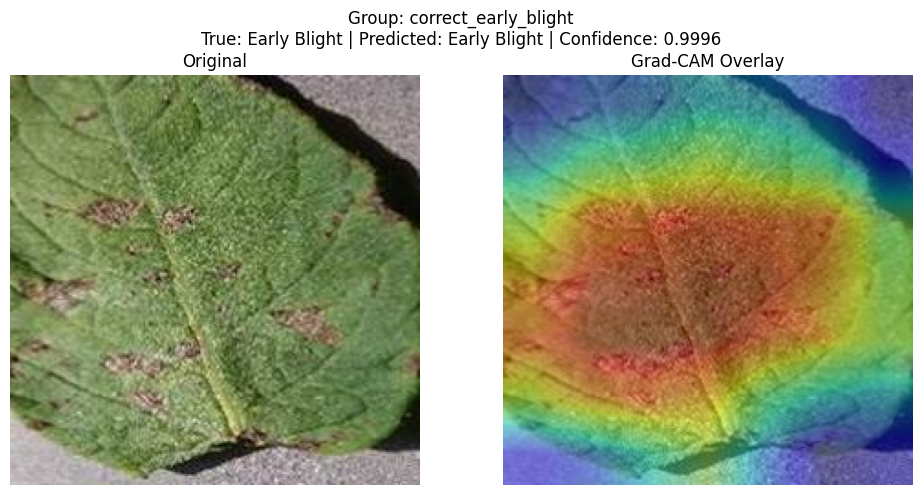

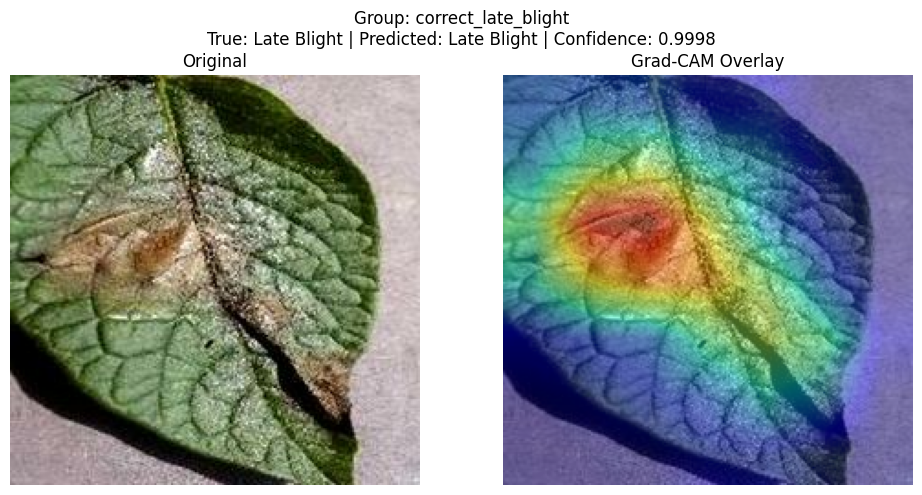

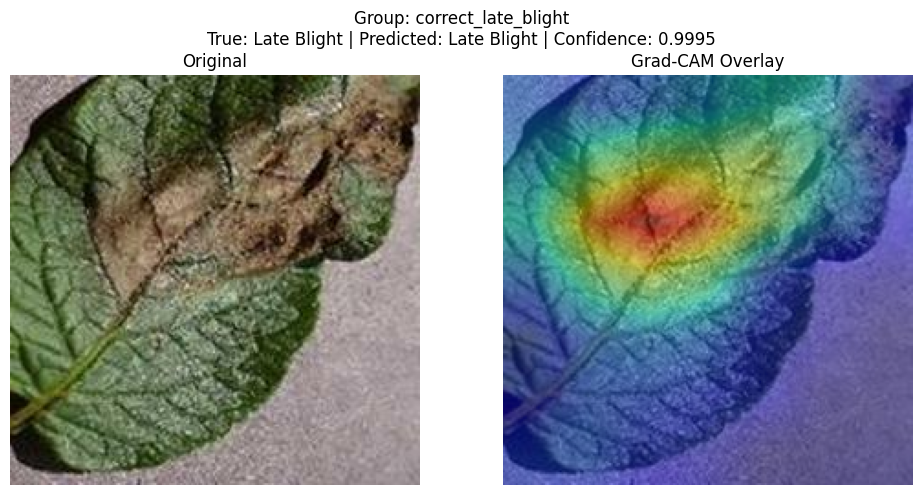

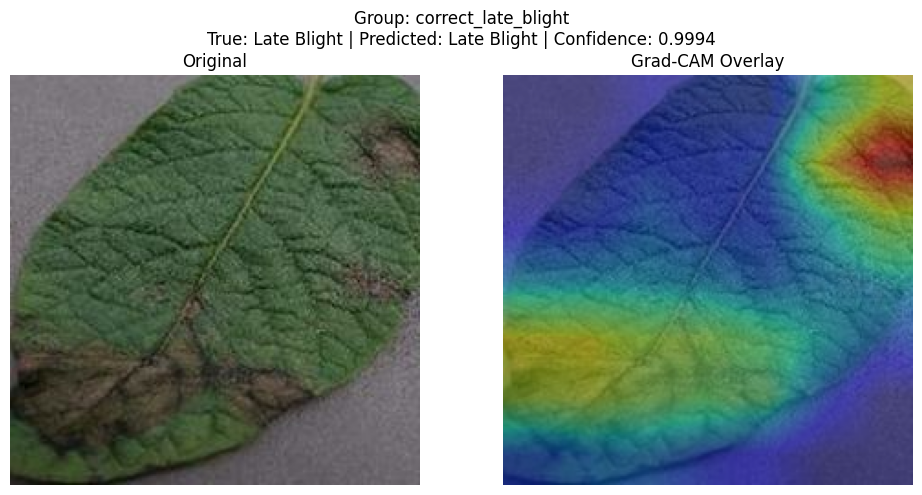


Saved Grad-CAM figures:
gradcam_efficientnet_7class_seed_2024/correct_fungal_diseases_fungal  (98)_jpg_gradcam.png
gradcam_efficientnet_7class_seed_2024/correct_fungal_diseases_fungal  (236)_jpg_gradcam.png
gradcam_efficientnet_7class_seed_2024/correct_fungal_diseases_fungal  (82)_jpg_gradcam.png
gradcam_efficientnet_7class_seed_2024/fungal_diseases_as_plant_pests_fungal  (495)_jpg_gradcam.png
gradcam_efficientnet_7class_seed_2024/fungal_diseases_as_plant_pests_fungal  (398)_jpg_gradcam.png
gradcam_efficientnet_7class_seed_2024/fungal_diseases_as_plant_pests_fungal  (29)_jpg_gradcam.png
gradcam_efficientnet_7class_seed_2024/plant_pests_as_fungal_diseases_plant pests (384)_jpg_gradcam.png
gradcam_efficientnet_7class_seed_2024/healthy_as_potato_virus_healthy (418)_jpg_gradcam.png
gradcam_efficientnet_7class_seed_2024/healthy_as_potato_virus_healthy (40)_jpg_gradcam.png
gradcam_efficientnet_7class_seed_2024/correct_early_blight_early blight (17)_JPG_gradcam.png
gradcam_efficientnet_7clas

In [27]:
saved_gradcam_paths = []

for _, sample in selected_df.iterrows():
    save_path = save_gradcam_figure(sample)
    saved_gradcam_paths.append(save_path)

print("\nSaved Grad-CAM figures:")
for path in saved_gradcam_paths:
    print(path)


In [28]:
PROJECT_EXPORT_NAME = "ICDM_7class_efficientnet_outputs"

!zip -r {PROJECT_EXPORT_NAME}.zip models history reports {OUTPUT_DIR} *.csv *.png

print("Created:", f"{PROJECT_EXPORT_NAME}.zip")


  adding: models/ (stored 0%)
  adding: models/EfficientNetB0_7class_seed_3407.keras (deflated 10%)
  adding: models/EfficientNetB0_7class_seed_2024.keras (deflated 10%)
  adding: models/EfficientNetB0_7class_seed_42.keras (deflated 10%)
  adding: models/EfficientNetB0_7class_seed_777.keras (deflated 10%)
  adding: models/EfficientNetB0_7class_seed_123.keras (deflated 10%)
  adding: history/ (stored 0%)
  adding: history/EfficientNetB0_7class_seed_2024_confusion_matrix.png (deflated 24%)
  adding: history/EfficientNetB0_7class_seed_3407_confusion_matrix.png (deflated 25%)
  adding: history/EfficientNetB0_7class_seed_123_confusion_matrix.png (deflated 24%)
  adding: history/EfficientNetB0_7class_seed_123_accuracy_loss.png (deflated 14%)
  adding: history/EfficientNetB0_7class_seed_3407_history.pkl (deflated 50%)
  adding: history/EfficientNetB0_7class_seed_777_confusion_matrix.png (deflated 24%)
  adding: history/EfficientNetB0_7class_seed_777_accuracy_loss.png (deflated 14%)
  adding: 